# **Training an MobileNetV3 Model for Medical Image Classification**

## **Data Loading**

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"saisumanthvandamasu","key":"f56d5e26bc565972cf891cb00b2b04bc"}'}

In [ ]:
!kaggle datasets download -d plhalvorsen/kvasir-v2-a-gastrointestinal-tract-dataset

Dataset URL: https://www.kaggle.com/datasets/plhalvorsen/kvasir-v2-a-gastrointestinal-tract-dataset
License(s): CC-BY-SA-4.0
100% 2.32G/2.32G [01:59<00:00, 23.2MB/s]
100% 2.32G/2.32G [01:59<00:00, 20.9MB/s]


In [ ]:
import zipfile
import os

# Path to the uploaded zip file
zip_file_path = "/content/kvasir-v2-a-gastrointestinal-tract-dataset.zip"  # Update with the correct path to your uploaded file

# Destination folder to extract the contents
destination_folder = "/content/dataset"
os.makedirs(destination_folder, exist_ok=True)  # Create destination folder if it doesn't exist

# Extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(destination_folder)

print(f"Zip file extracted to {destination_folder}")


Zip file extracted to /content/dataset


In [ ]:
import os
import shutil

# Root directory of the dataset (e.g., after unzipping)
root_dir = "/content/dataset"  # Change to your dataset's location
dest_directory = "/content/working/dataset"  # Destination for reorganized dataset
os.makedirs(dest_directory, exist_ok=True)  # Create the destination directory

# Copy files into a format compatible with Keras dataloaders
for directory in os.listdir(root_dir):
    dir_path = os.path.join(root_dir, directory)
    destination = os.path.join(dest_directory, directory)
    os.makedirs(destination, exist_ok=True)

    # Handle nested directories
    for directory2 in os.listdir(dir_path):
        dir_path2 = os.path.join(dir_path, directory2)
        for image in os.listdir(dir_path2):
            image_path = os.path.join(dir_path2, image)
            dest_path = os.path.join(destination, image)
            shutil.copy(image_path, dest_path)

print(f"Dataset reorganized at {dest_directory}")


Dataset reorganized at /content/working/dataset


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Path to the dataset
dataset_path = "/content/working/dataset"

# Function to collect image data
def collect_image_data(dataset_path):
    file_names = []
    file_sizes = []
    image_shapes = []
    classes = []

    for root, _, files in os.walk(dataset_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                file_path = os.path.join(root, file)
                file_names.append(file)
                classes.append(os.path.basename(root))

                # Get file size in KB
                file_sizes.append(os.path.getsize(file_path) / 1024)

                # Get image dimensions
                try:
                    with Image.open(file_path) as img:
                        image_shapes.append(img.size)
                except Exception as e:
                    print(f"Error reading {file}: {e}")
                    image_shapes.append((0, 0))

    return pd.DataFrame({
        "File Name": file_names,
        "Class": classes,
        "File Size (KB)": file_sizes,
        "Image Width": [shape[0] for shape in image_shapes],
        "Image Height": [shape[1] for shape in image_shapes]
    })

# Collecting image data
image_data = collect_image_data(dataset_path)

### **Representation of Structure of Dataset**

<ipython-input-14-ca4d739e5cfb>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=image_data, x="Class", palette="viridis")


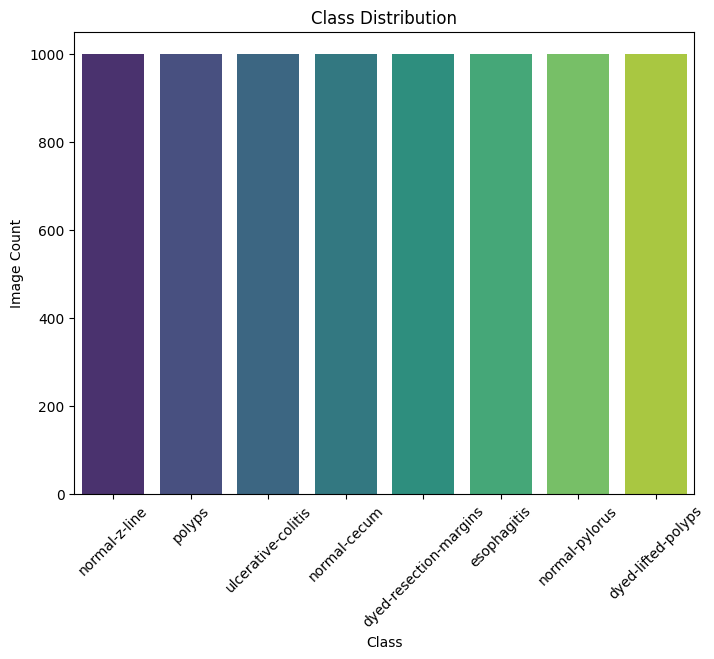

In [ ]:
# Class Distribution (Bar Chart)
plt.figure(figsize=(8, 6))
sns.countplot(data=image_data, x="Class", palette="viridis")
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Image Count")
plt.xticks(rotation=45)
plt.show()


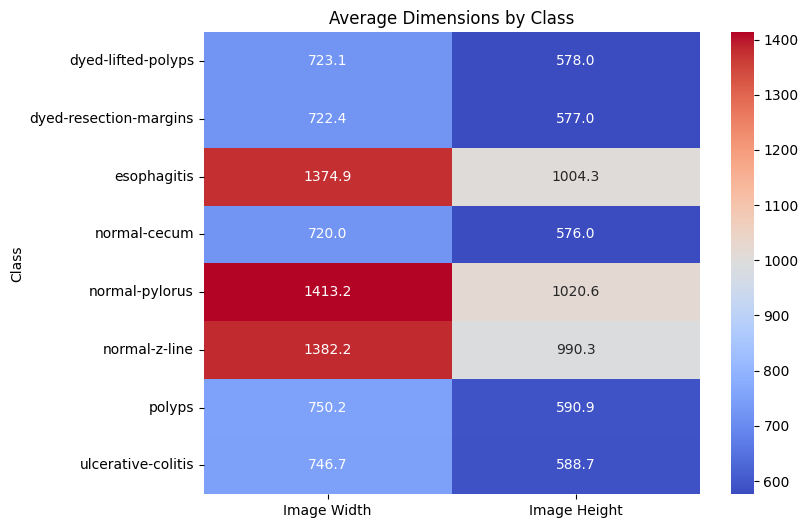

In [ ]:
# Heatmap of Average Dimensions by Class
avg_dimensions = image_data.groupby("Class")[["Image Width", "Image Height"]].mean()
plt.figure(figsize=(8, 6))
sns.heatmap(avg_dimensions, annot=True, fmt=".1f", cmap="coolwarm")
plt.title("Average Dimensions by Class")
plt.show()


## **Listing Physical Devices for TensorFlow**

In [ ]:
import tensorflow as tf
tf.config.list_physical_devices(
    device_type=None
)

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers import Dense,Flatten
from tensorflow.keras import Sequential

from tensorflow.keras.layers import Dense, Dropout

from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.losses import CategoricalCrossentropy


from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, classification_report, accuracy_score, roc_curve, auc

import warnings
warnings.filterwarnings("ignore")

tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

##**Creating Training and Validation Datasets**

In [ ]:
dataset_path = "/content/working/dataset"
image_size = 224, 224
batch_size = 128

train_ds = image_dataset_from_directory(
  dataset_path,
  validation_split=0.2,
  subset="training",
  label_mode="categorical",
  seed=23,
  image_size=image_size,
  batch_size=batch_size)


val_ds = image_dataset_from_directory(
  dataset_path,
  validation_split=0.2,
  subset="validation",
  label_mode="categorical",
  seed=23,
  image_size=image_size,
  batch_size=batch_size)

Found 8000 files belonging to 8 classes.
Using 6400 files for training.
Found 8000 files belonging to 8 classes.
Using 1600 files for validation.


In [ ]:
class_names = train_ds.class_names

In [ ]:
# Returns the cardinality of the data
val_batches = tf.data.experimental.cardinality(val_ds)
test_ds = val_ds.take(val_batches // 2)
val_ds = val_ds.skip(val_batches // 2)

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)

## **Constructing and Compiling a Transfer Learning Model**

In [ ]:
from tensorflow.keras.regularizers import l2

In [ ]:
model = Sequential()
base_model = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    weights="imagenet",
    input_shape = (224,224, 3))


for layer in base_model.layers:
        layer.trainable=True
model.add(base_model)
model.add(Flatten())
model.add(Dense(8, activation='softmax'))
# # Add Dropout for regularization
# model.add(Dropout(0.5))

# Add final Dense layer for classification (softmax for multi-class)
model.add(Dense(8, activation='softmax', kernel_regularizer=l2(0.01)))


model.compile(optimizer=AdamW(learning_rate=1e-4, weight_decay=0.004, beta_1=0.9, beta_2=0.999, epsilon=1e-8),
          loss=CategoricalCrossentropy(),
          metrics=['accuracy'])

12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobileNetV3Large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 47040)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 8)                   │         376,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 8)                   │              72 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,372,752 (12.87 MB)

 Trainable params: 3,348,352 (12.77 MB)

 Non-trainable params: 24,400 (95.31 KB)

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=1e-6)

best = ModelCheckpoint(filepath="/content/mobilenetv3.weights.h5",
                                         save_weights_only=True,
                                         monitor="val_accuracy",
                                         mode="max",
                                         save_best_only=True)

early_stop = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
model.fit(train_ds, epochs=100, validation_data=val_ds, callbacks=[reduce_lr, best, early_stop])

Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 161s 1s/step - accuracy: 0.4052 - loss: 1.9862 - val_accuracy: 0.5060 - val_loss: 1.9085 - learning_rate: 1.0000e-04
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.6145 - loss: 1.8524 - val_accuracy: 0.5204 - val_loss: 1.8967 - learning_rate: 1.0000e-04
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.6455 - loss: 1.8385 - val_accuracy: 0.5925 - val_loss: 1.9020 - learning_rate: 1.0000e-04
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.7007 - loss: 1.8272 - val_accuracy: 0.6286 - val_loss: 1.8900 - learning_rate: 1.0000e-04
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.7859 - loss: 1.8038 - val_accuracy: 0.6490 - val_loss: 1.8746 - learning_rate: 1.0000e-04
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.8315 - loss: 1.7838 - val_accuracy: 0.6550 - val_loss: 1.8747 - learning_rate: 1.0000e-04
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.8451

In [ ]:
model.save("/content/mobilenetv3.h5")

In [ ]:
history = model.history

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

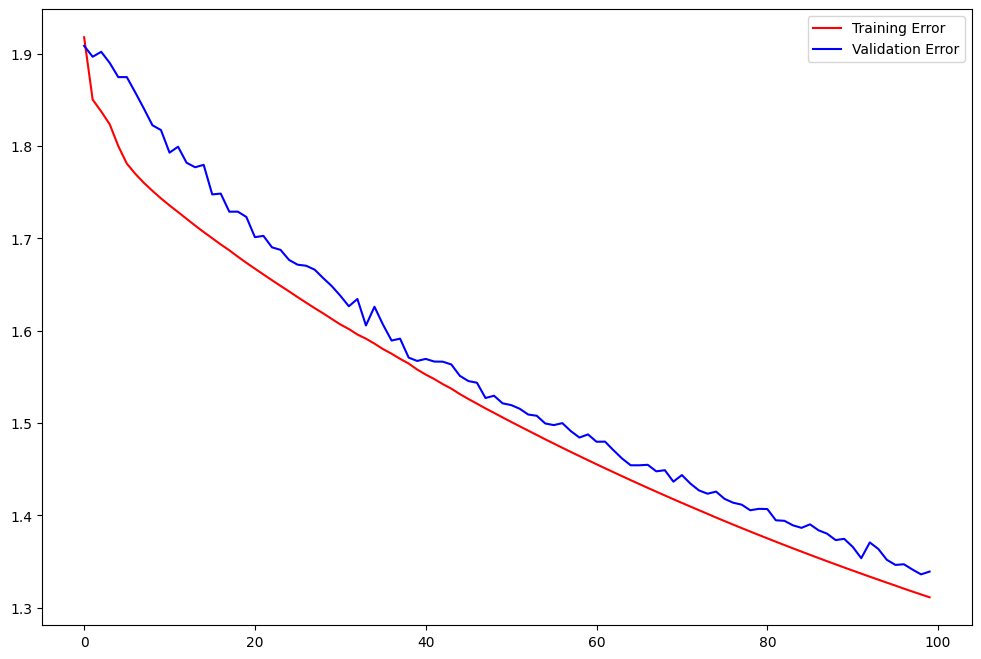

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(loss,color='r',label='Training Error')
plt.plot(val_loss, color='b',label='Validation Error')
plt.legend()
plt.show()

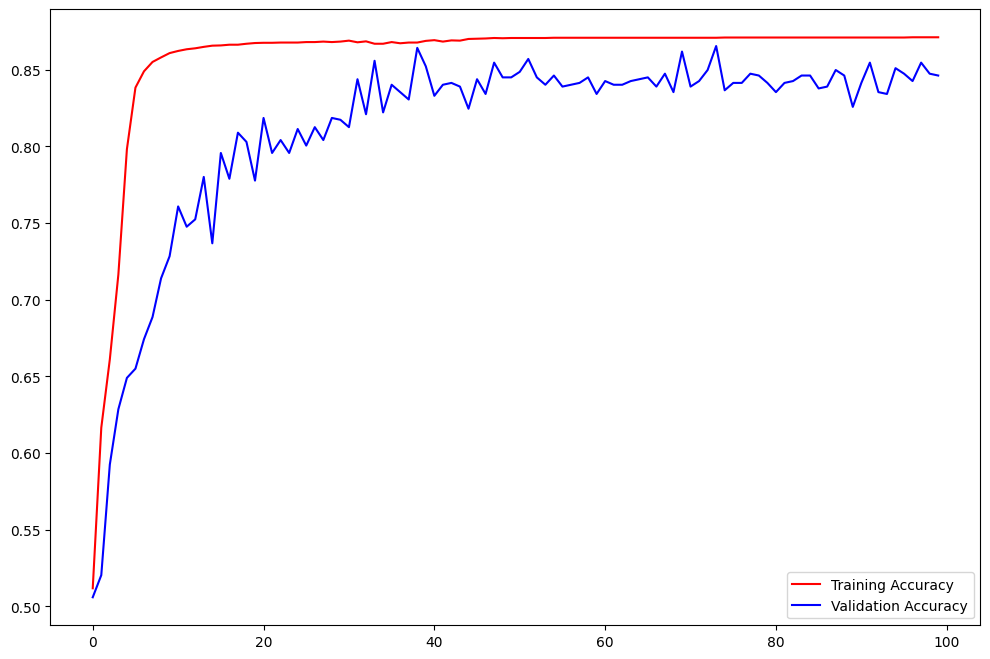

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(accuracy,color='r',label='Training Accuracy')
plt.plot(val_accuracy, color='b',label='Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
true_labels = []
predicted_labels = []

# Iterate through test dataset to get true labels
for images, labels in test_ds:
    true_labels.extend(np.argmax(labels.numpy(), axis=1))  # Assuming one-hot encoded labels

    # Predict labels using the model
    predictions = model.predict(images)
    predicted_labels.extend(np.argmax(predictions, axis=1))

# Convert lists to NumPy arrays for easier processing
true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


In [ ]:
accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.84


## **Plotting the Confusion Matrix**

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[ 77   5   0   0   0   0   0   0]
 [  9  82   0   1   0   0   0   0]
 [  0   0  93   0   0   0   0   0]
 [  0   0   0  87   0   0   1   2]
 [  0   0   0   0  99   0   0   0]
 [  0   0  95   0   0   0   0   0]
 [  1   0   0   3   3   0  97   2]
 [  0   0   1   1   1   0   1 107]]


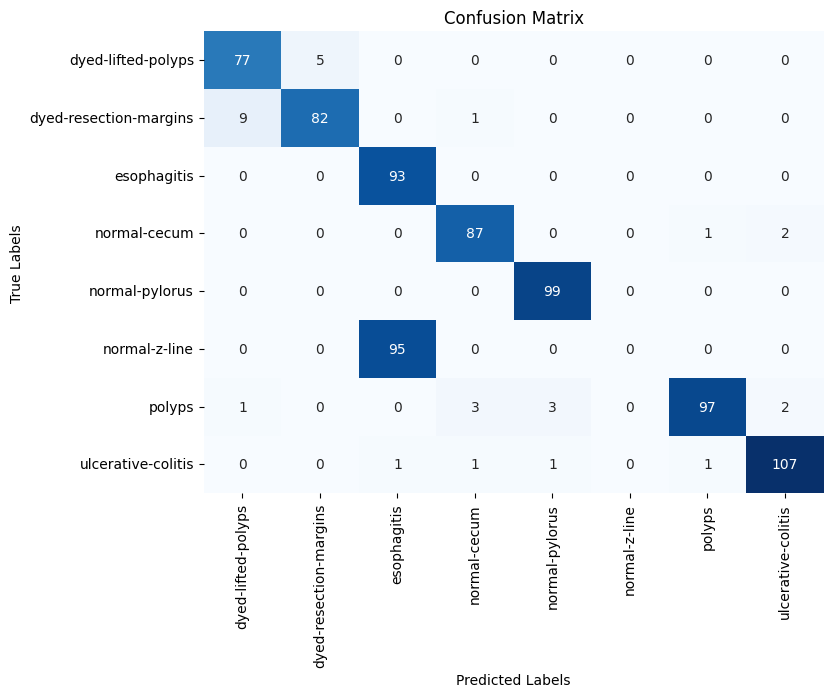

In [ ]:
import seaborn as sns
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

## **Grad-Cam**

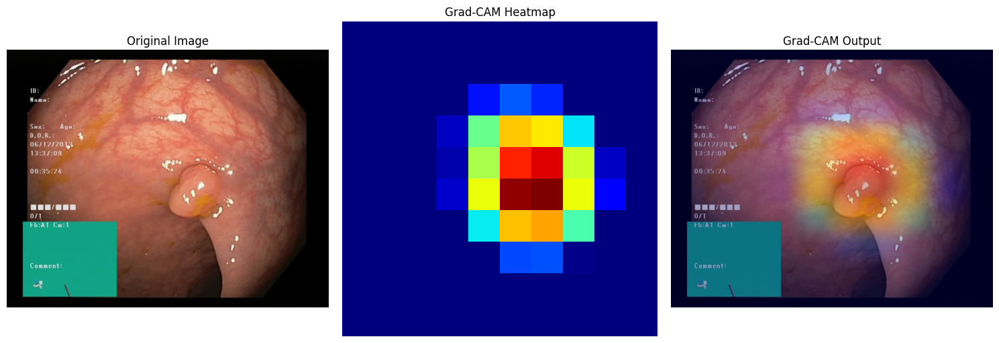

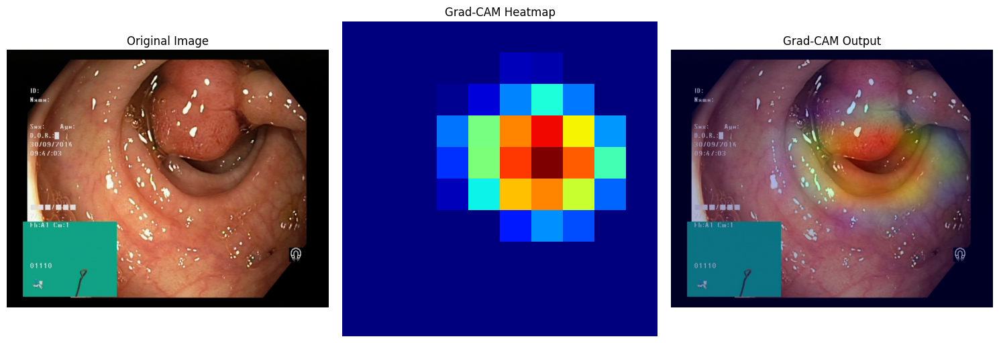

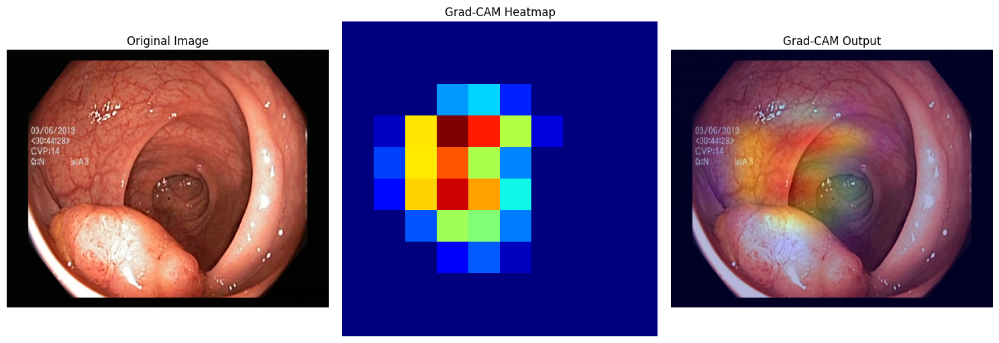

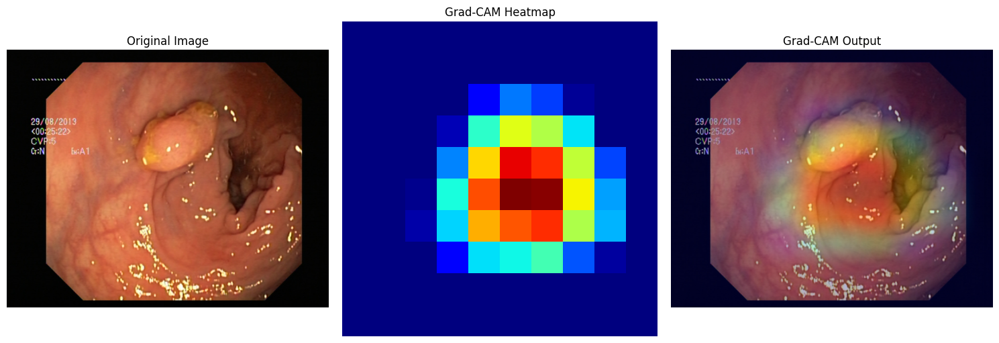

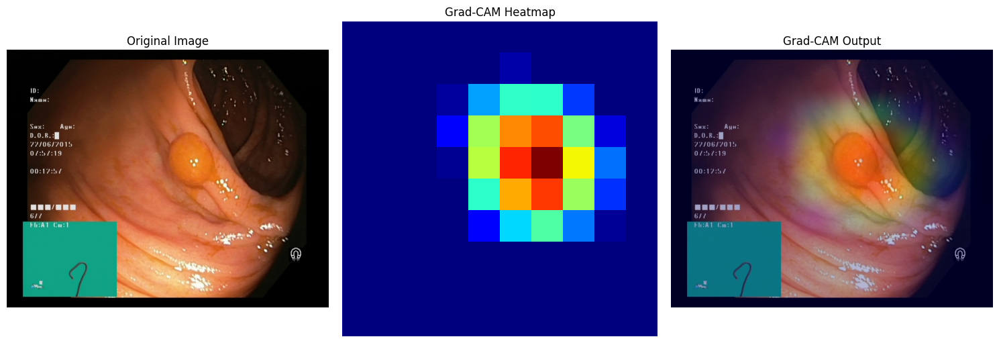

...

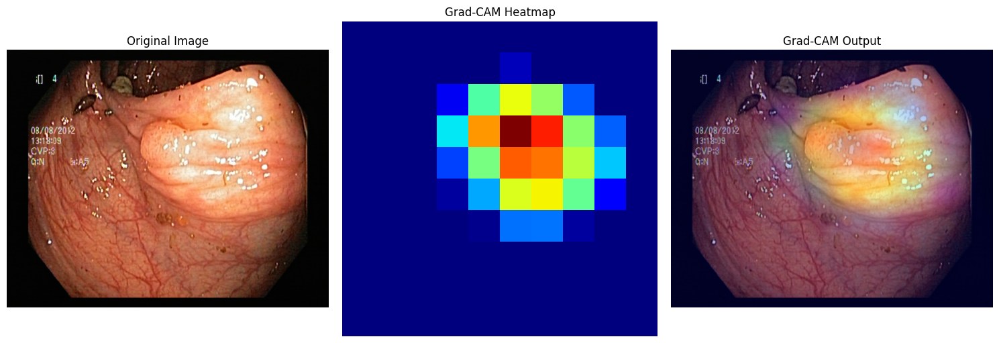

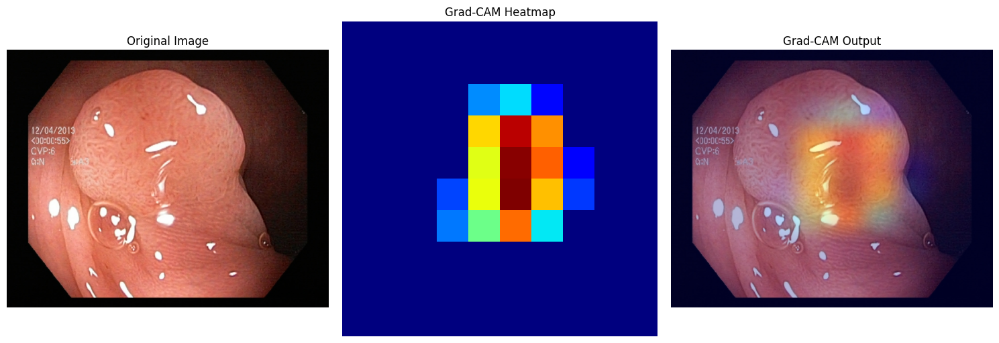

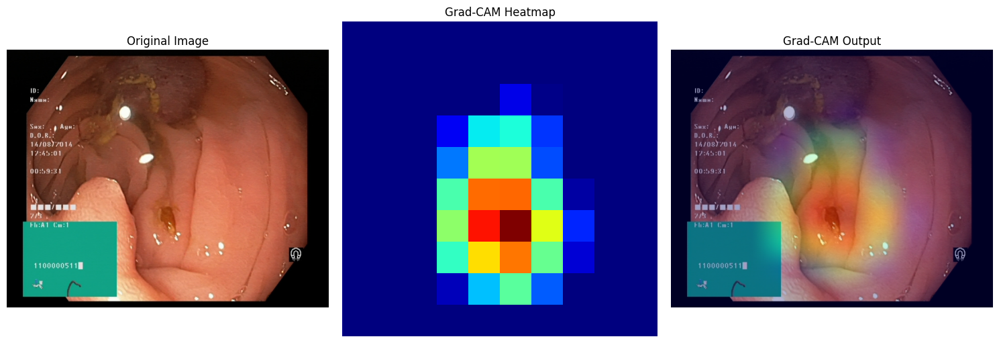

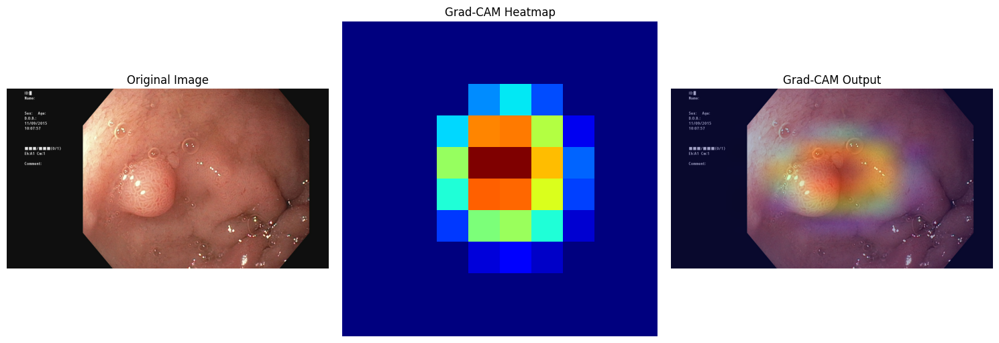

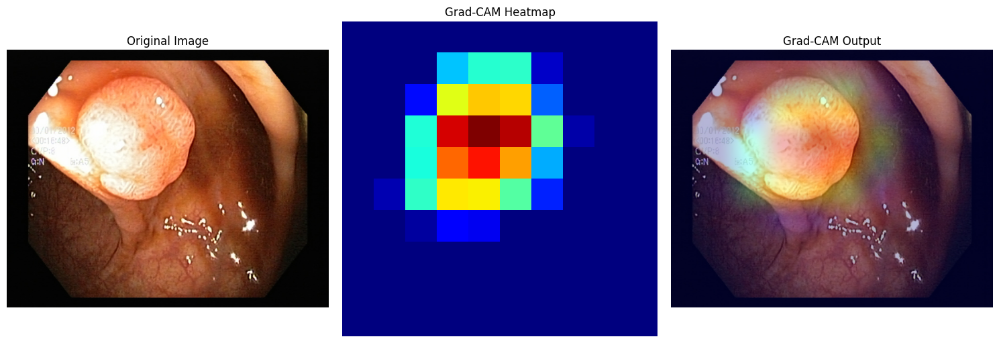

In [ ]:
import os
import warnings
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from PIL import Image as PILImage
import matplotlib as mpl

# Suppress TensorFlow logs and warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow logs
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")  # Suppress Matplotlib warnings

# Function to get the last convolutional layer
def get_last_conv_layer(model):
    for layer in reversed(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer
    raise ValueError("No convolutional layer found in the model.")

# Function to preprocess the input image
def get_img_array(img_path, size):
    img = keras.utils.load_img(img_path, target_size=size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    # Preprocess for Xception
    array = keras.applications.xception.preprocess_input(array)
    return array

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)

        if pred_index is None:
            pred_index = tf.argmax(preds[0])  # Use the predicted class if not specified
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Function to create Grad-CAM overlay
def create_gradcam_overlay(img_path, heatmap, alpha=0.4):
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Convert heatmap to a color map (Jet)
    heatmap = np.uint8(255 * heatmap)
    jet = mpl.colormaps["jet"]  # Updated for Matplotlib 3.7+
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))  # Resize to match the original image
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on the image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    return superimposed_img

# Batch processing of images
img_dir = "/content/working/dataset/"
output_dir = "/content/gradcam_outputs/"  # Directory to save Grad-CAM results
os.makedirs(output_dir, exist_ok=True)

# Get a list of image paths (randomly selecting 10-15)
img_paths = [os.path.join(img_dir, fname) for fname in os.listdir(img_dir) if fname.endswith(('.jpg', '.png'))]
img_paths = np.random.choice(img_paths, size=min(15, len(img_paths)), replace=False)

# Model setup
weights_path='/content/mobilenetv3.weights.h5'
model = tf.keras.applications.MobileNetV3(weights=weights_path)

# Get the last convolutional layer dynamically
last_conv_layer = get_last_conv_layer(model)

img_size = (224,224)
# Process each image
for i, img_path in enumerate(img_paths):
    # print(f"Processing image {i+1}/{len(img_paths)}: {img_path}")

    # Preprocess the image
    img_array = get_img_array(img_path, img_size)

    # Predict the class for the image
    preds = model.predict(img_array, verbose=0)
    pred_class = keras.applications.MobileNetV3.decode_predictions(preds, top=1)[0][0][1]  # Extract class name

    # Generate Grad-CAM heatmap
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer)

    # Create Grad-CAM overlay
    gradcam_img = create_gradcam_overlay(img_path, heatmap)

    # Display original image, heatmap, and Grad-CAM overlay in a row
    original_img = keras.utils.load_img(img_path)
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(original_img)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    ax[1].imshow(heatmap, cmap="jet")
    ax[1].set_title("Grad-CAM Heatmap")
    ax[1].axis("off")

    ax[2].imshow(gradcam_img)
    ax[2].set_title(f"Grad-CAM Output")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

    # Save the Grad-CAM overlay
    gradcam_output_path = os.path.join(output_dir, f"gradcam_{i+1}.jpg")
    gradcam_img.save(gradcam_output_path)


## **GradCam for Xception**

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


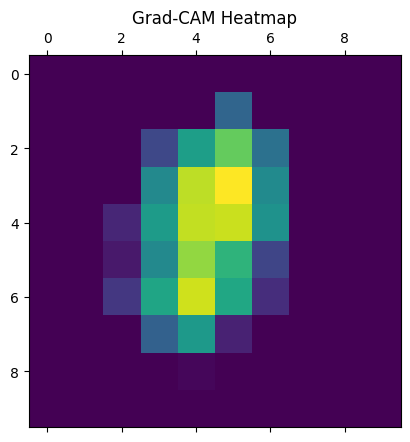

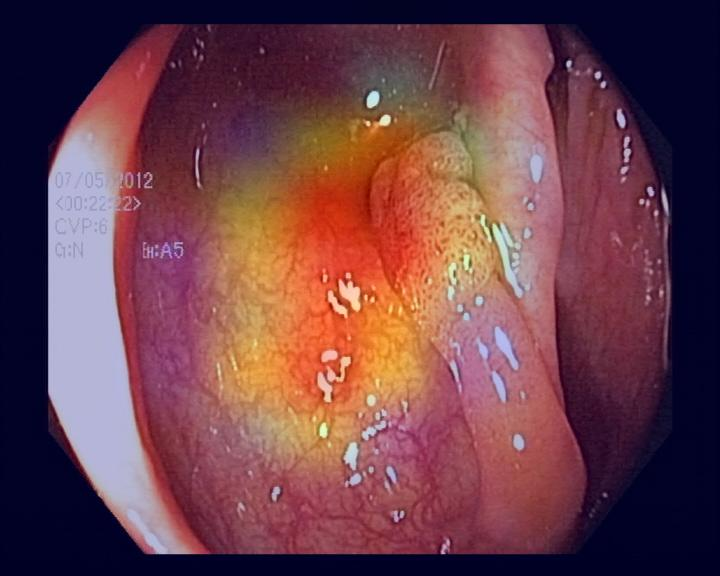

In [ ]:
import os
import warnings
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from IPython.display import display
import matplotlib as mpl

# Suppress TensorFlow logs and warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow logs
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")  # Suppress Matplotlib warnings

# Function to preprocess the input image
def get_img_array(img_path, size):
    img = keras.utils.load_img(img_path, target_size=size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    # Preprocess for Xception
    array = keras.applications.xception.preprocess_input(array)
    return array

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)

        if pred_index is None:
            pred_index = tf.argmax(preds[0])  # Use the predicted class if not specified
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Function to save and display Grad-CAM output
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Convert heatmap to a color map (Jet)
    heatmap = np.uint8(255 * heatmap)
    jet = mpl.colormaps["jet"]  # Updated for Matplotlib 3.7+
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))  # Resize to match the original image
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on the image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save and display the image
    superimposed_img.save(cam_path)
    display(PILImage.open(cam_path))

# Image path and model setup
img_path = "/content/working/dataset/polyps/006338df-e61e-4725-bb6c-dd0620f11cdc.jpg"  # Replace with the path to your image
img_size = (299, 299)  # Input size for Xception
last_conv_layer_name = "block14_sepconv2"  # Correct layer name for Xception

# Load and preprocess the image
img_array = get_img_array(img_path, img_size)

# Load the Xception model
model = keras.applications.Xception(weights="imagenet")
model.layers[-1].activation = None  # Disable softmax for Grad-CAM

# Predict the class for the image
preds = model.predict(img_array)
# Remove or comment out the following line to suppress predictions
# print("Predicted class:", keras.applications.xception.decode_predictions(preds, top=1)[0])

# Generate Grad-CAM heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display the heatmap
plt.matshow(heatmap)
plt.title("Grad-CAM Heatmap")
plt.show()

# Save and display the Grad-CAM overlay
save_and_display_gradcam(img_path, heatmap)
